In [ ]:
import os 
os.chdir("../")
os.chdir("../")

In [7]:
os.getcwd()

'/media/hamza/Disque local1/Hamza Bouajila/Portfolio/Cats-and-Dogs-classification'

In [9]:
from app.core.config import settings
import requests

In [11]:
limit=10
cat_images = requests.get(url=f"https://api.thecatapi.com/v1/images/search?limit={limit}&breed_ids=beng&api_key={settings.THE_CAT_API_KEY}")

In [20]:
requests.get(cat_images.json()[0]["url"]).content

b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x02\x00\x00\x01\x00\x01\x00\x00\xff\xed\x00|Photoshop 3.0\x008BIM\x04\x04\x00\x00\x00\x00\x00_\x1c\x02(\x00ZFBMD23000987030000cb2c0000c1350000e63f0000bb9100006ac40000fcf000003e3201008e640100069d0100\x00\xff\xe2\x02\x1cICC_PROFILE\x00\x01\x01\x00\x00\x02\x0clcms\x02\x10\x00\x00mntrRGB XYZ \x07\xdc\x00\x01\x00\x19\x00\x03\x00)\x009acspAPPL\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xd6\x00\x01\x00\x00\x00\x00\xd3-lcms\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\ndesc\x00\x00\x00\xfc\x00\x00\x00^cprt\x00\x00\x01\\\x00\x00\x00\x0bwtpt\x00\x00\x01h\x00\x00\x00\x14bkpt\x00\x00\x01|\x00\x00\x00\x14rXYZ\x00\x00\x01\x90\x00\x00\x00\x14gXYZ\x00\x00\x01\xa4\x00\x00\x00\x14bXYZ\x00\x00\x01\xb8\x00\x00\x00\x14rTRC\x00\x00\x01\xcc\x00\x00\x00@gTRC\x00\x00\

In [22]:
import PIL
import numpy as np
from io import BytesIO

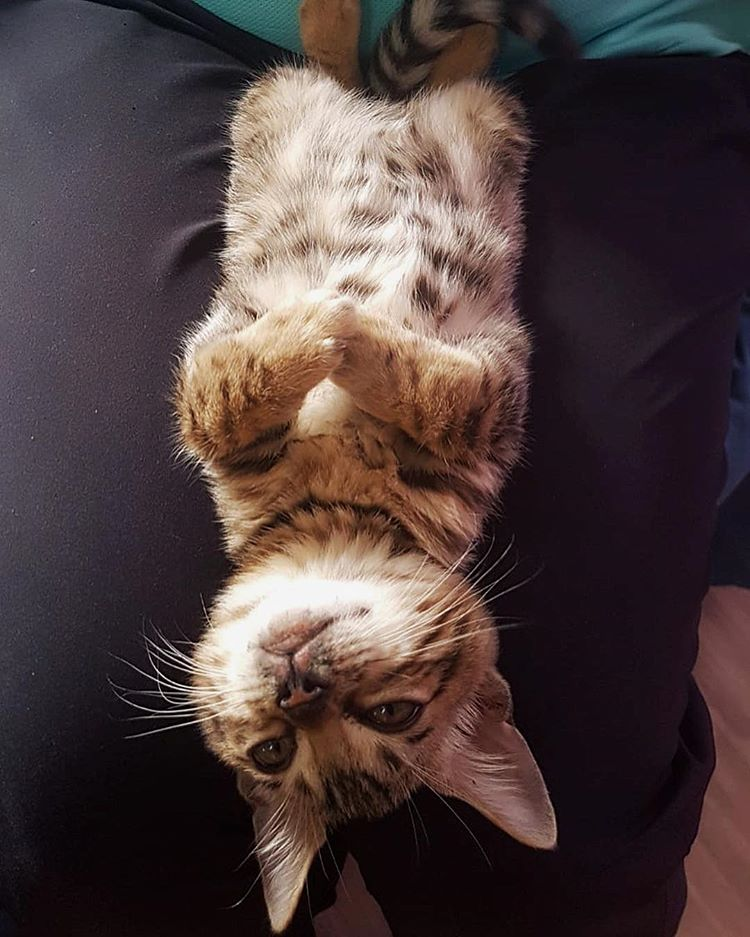

In [23]:
PIL.Image.open(BytesIO(requests.get(cat_images.json()[0]["url"]).content))

In [25]:
import aiohttp
import asyncio

async def fetch_data(limit:int=10):
        async with aiohttp.ClientSession() as session:
            # Get cat and dog image metadata
            async with session.get(f"https://api.thecatapi.com/v1/images/search?limit={limit}&breed_ids=beng&api_key={settings.THE_CAT_API_KEY}") as cat_response:
                cat_images = await cat_response.json()
            
            async with session.get(f"https://api.thedogapi.com/v1/images/search?limit={limit}&breed_ids=beng&api_key={settings.THE_DOG_API_KEY}") as dog_response:
                dog_images = await dog_response.json()

            # Extract image URLs
            cat_urls = [img["url"] for img in cat_images]
            dog_urls = [img["url"] for img in dog_images]

            # Fetch image bytes concurrently
            async def fetch_image(url):
                async with session.get(url) as response:
                    return await response.read()

            cat_bytes = await asyncio.gather(*[fetch_image(url) for url in cat_urls])
            dog_bytes = await asyncio.gather(*[fetch_image(url) for url in dog_urls])

            return cat_bytes, dog_bytes

In [27]:
cats,dogs = await fetch_data()

In [28]:
cats

[b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xed\x00|Photoshop 3.0\x008BIM\x04\x04\x00\x00\x00\x00\x00_\x1c\x02(\x00ZFBMD23000967010000e4390000b73f0000784500007476000091ad000059bd00006620010050480100f2560100\x00\xff\xdb\x00C\x00\n\n\n\n\n\n\x0b\x0c\x0c\x0b\x0f\x10\x0e\x10\x0f\x16\x14\x13\x13\x14\x16"\x18\x1a\x18\x1a\x18"3 %  % 3-7,),7-Q@88@Q^OJO^qeeq\x8f\x88\x8f\xbb\xbb\xfb\xff\xdb\x00C\x01\n\n\n\n\n\n\x0b\x0c\x0c\x0b\x0f\x10\x0e\x10\x0f\x16\x14\x13\x13\x14\x16"\x18\x1a\x18\x1a\x18"3 %  % 3-7,),7-Q@88@Q^OJO^qeeq\x8f\x88\x8f\xbb\xbb\xfb\xff\xc2\x00\x11\x08\x048\x048\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1c\x00\x00\x02\x03\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x00\x03\x04\x05\x06\x07\x08\xff\xc4\x00\x18\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\xff\xda\x00\x0c\x03\x01\x00\x02\x10\x03\x10\x00\x00\x00\xf0\xf87\xe0\xce\xa5V*\xe2\xb04\xf4;\x87\xcf\xae<i\xb6\xba\x9b\x1a\x15X\xb2\x84p